# Image Generation Using Stable Diffusion API

**Author:** [Vijay Sharma]  
**Date:** April 1, 2026  
**Course:** [DSC670- Advance Users of Gen AI]

## Overview
This notebook demonstrates the use of the Stable Diffusion API to generate and manipulate images through programmatic prompts. We will explore the API's capabilities, generate images using carefully crafted prompts, and evaluate the ease of use and quality of results.

## Setup and Installation

First, I need to install the required libraries to interact with the Stable Diffusion API. I will use the `replicate` library depending on which service you choose.

1. **Replicate API** (https://replicate.com/)

For this notebook, I'll demonstrate using the Replicate API as it's straightforward and well-documented.

In [21]:
# Install required packages
%pip install replicate pillow requests python-dotenv matplotlib

Note: you may need to restart the kernel to use updated packages.


In [22]:
# Import required libraries
import replicate
import os
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
from dotenv import load_dotenv

# Load environment variables (API keys)
load_dotenv()

# Set your API token
# Get your token from: https://replicate.com/account/api-tokens
os.environ["REPLICATE_API_TOKEN"] = "r8_0w0IxUC5yIRoWw7WdfTpQVEZEoCQxsv144uBQ"  # Replace with your actual API key

print("Libraries imported successfully!")

Libraries imported successfully!


## Define Image Prompts

I've created four distinct prompts that will be used across multiple AI interfaces. These prompts are designed to test different aspects of image generation:

1. **Landscape/Environment** - Testing natural scene generation
2. **Character/Portrait** - Testing human/creature rendering
3. **Abstract/Artistic** - Testing creative interpretation
4. **Technical/Architectural** - Testing precision and detail

In [23]:
# Define our four prompts
prompts = {
    "prompt1_landscape": "A serene mountain lake at sunset, with snow-capped peaks reflected in crystal clear water, pine trees in the foreground, vibrant orange and purple sky, photorealistic, 8k quality",
    
    "prompt2_character": "A wise elderly wizard with a long silver beard, wearing deep blue robes embroidered with golden stars, holding a glowing staff, kind eyes, detailed fantasy art style, dramatic lighting",
    
    "prompt3_abstract": "Abstract representation of artificial intelligence: flowing neural networks made of light, geometric patterns, cyan and magenta color palette, digital art, futuristic, high contrast",
    
    "prompt4_architectural": "Modern sustainable architecture: glass and timber eco-house built into a hillside, large windows, green roof with plants, solar panels, minimalist design, architectural photography style"
}

# Display prompts
for key, prompt in prompts.items():
    print(f"\n{key}:")
    print(f"{prompt}")


prompt1_landscape:
A serene mountain lake at sunset, with snow-capped peaks reflected in crystal clear water, pine trees in the foreground, vibrant orange and purple sky, photorealistic, 8k quality

prompt2_character:
A wise elderly wizard with a long silver beard, wearing deep blue robes embroidered with golden stars, holding a glowing staff, kind eyes, detailed fantasy art style, dramatic lighting

prompt3_abstract:
Abstract representation of artificial intelligence: flowing neural networks made of light, geometric patterns, cyan and magenta color palette, digital art, futuristic, high contrast

prompt4_architectural:
Modern sustainable architecture: glass and timber eco-house built into a hillside, large windows, green roof with plants, solar panels, minimalist design, architectural photography style


## Helper Functions

These functions will help us download and display the generated images.

In [24]:
def download_image(url, filename):
    """
    Download an image from a URL and save it locally.
    
    Args:
        url (str): URL of the image
        filename (str): Local filename to save the image
    
    Returns:
        PIL.Image: Downloaded image object
    """
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    img.save(filename)
    print(f"Image saved as: {filename}")
    return img

def display_image(image, title="Generated Image"):
    """
    Display an image using matplotlib.
    
    Args:
        image (PIL.Image): Image to display
        title (str): Title for the plot
    """
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.title(title, fontsize=14, pad=20)
    plt.tight_layout()
    plt.show()

print("Helper functions defined successfully!")

Helper functions defined successfully!


## Image Generation with Stable Diffusion

Now I will use the Stable Diffusion model to generate images from our prompts. The Replicate API provides access to various versions of Stable Diffusion. We'll use SDXL (Stable Diffusion XL) for high-quality results.

### Parameters Explained:
- **prompt**: The text description of what we want to generate
- **negative_prompt**: What we want to avoid in the image
- **width/height**: Image dimensions (typically 1024x1024 for SDXL)
- **num_outputs**: Number of images to generate
- **num_inference_steps**: More steps = better quality but slower (typically 30-50)
- **guidance_scale**: How closely to follow the prompt (7-12 is typical)

### Prompt 1: Landscape Generation

Generating landscape image...
Prompt: A serene mountain lake at sunset, with snow-capped peaks reflected in crystal clear water, pine trees in the foreground, vibrant orange and purple sky, photorealistic, 8k quality

This may take 30-60 seconds...

Image saved as: landscape_sd.png


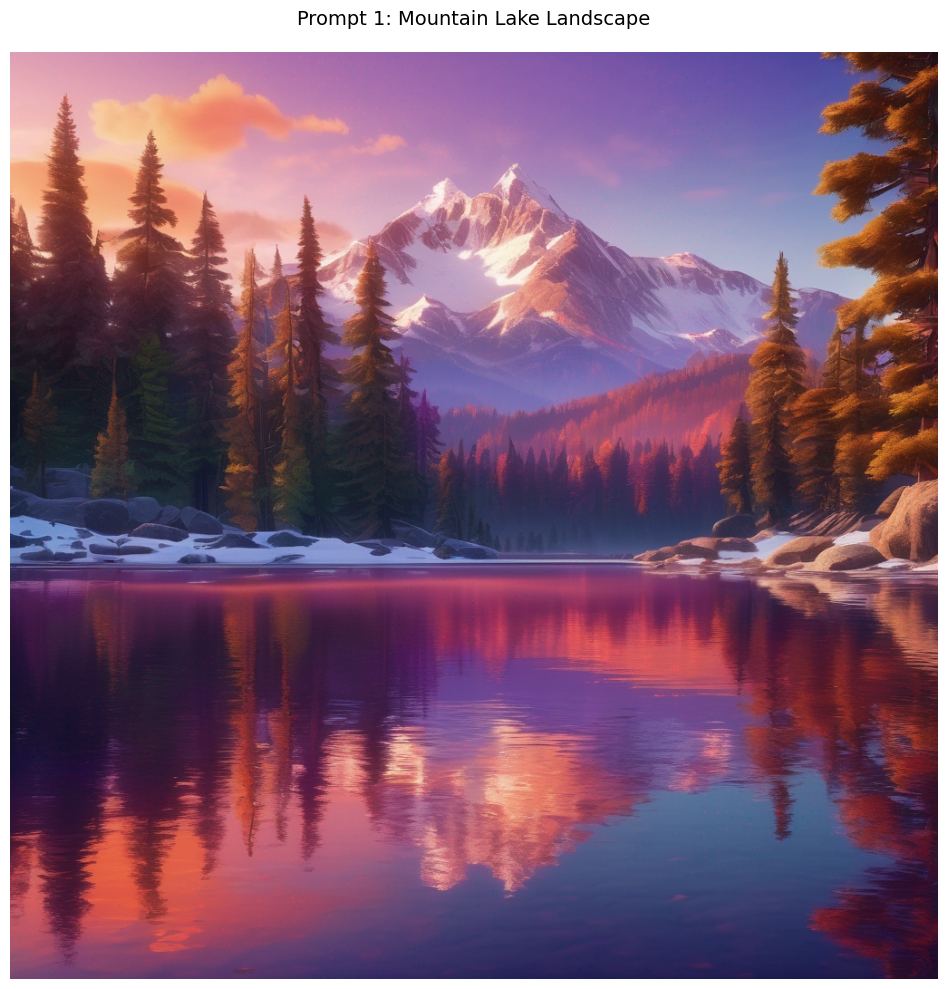

In [25]:
# Generate Image 1: Landscape
print("Generating landscape image...")
print(f"Prompt: {prompts['prompt1_landscape']}")
print("\nThis may take 30-60 seconds...\n")

output = replicate.run(
    "stability-ai/sdxl:39ed52f2a78e934b3ba6e2a89f5b1c712de7dfea535525255b1aa35c5565e08b",
    input={
        "prompt": prompts['prompt1_landscape'],
        "negative_prompt": "ugly, blurry, low quality, distorted, deformed",
        "width": 1024,
        "height": 1024,
        "num_outputs": 1,
        "num_inference_steps": 40,
        "guidance_scale": 7.5
    }
)

# Download and display the image
img1 = download_image(output[0], "landscape_sd.png")
display_image(img1, "Prompt 1: Mountain Lake Landscape")

### Prompt 2: Character Generation

Generating character image...
Prompt: A wise elderly wizard with a long silver beard, wearing deep blue robes embroidered with golden stars, holding a glowing staff, kind eyes, detailed fantasy art style, dramatic lighting

This may take 30-60 seconds...

Image saved as: character_sd.png


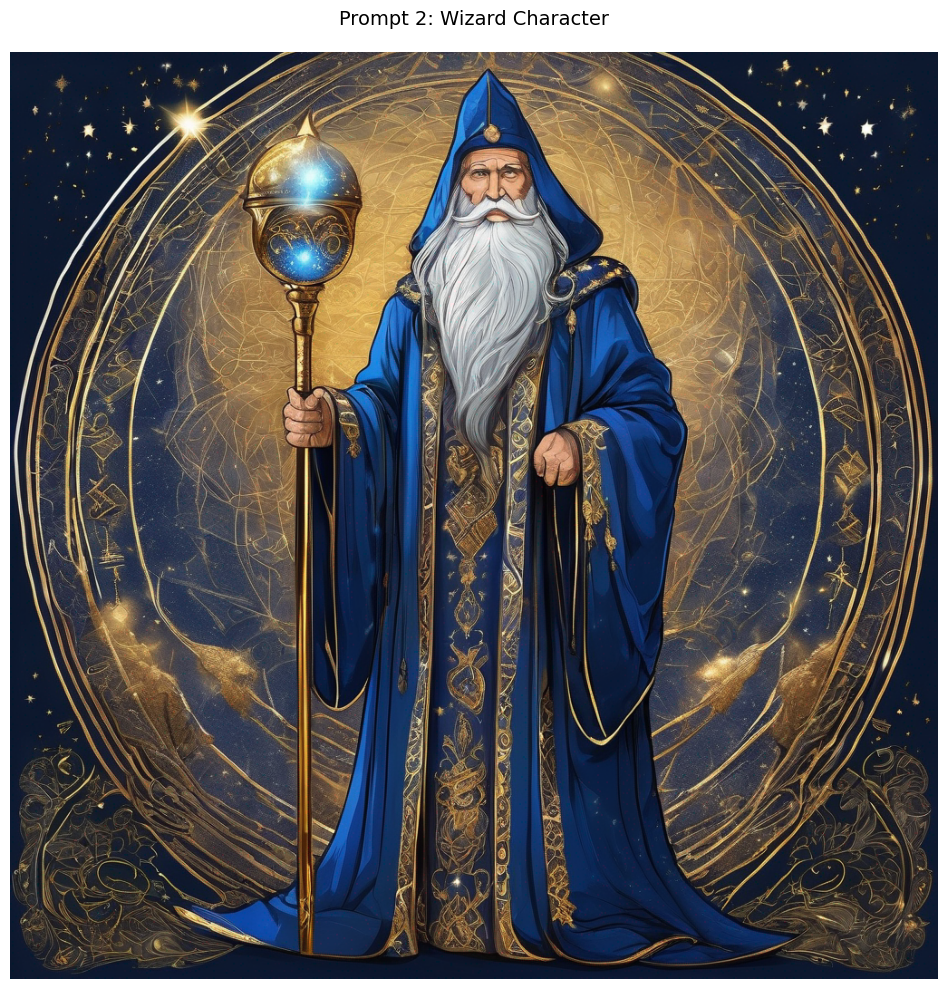

In [26]:
# Generate Image 2: Character
print("Generating character image...")
print(f"Prompt: {prompts['prompt2_character']}")
print("\nThis may take 30-60 seconds...\n")

output = replicate.run(
    "stability-ai/sdxl:39ed52f2a78e934b3ba6e2a89f5b1c712de7dfea535525255b1aa35c5565e08b",
    input={
        "prompt": prompts['prompt2_character'],
        "negative_prompt": "ugly, distorted face, extra limbs, deformed hands, blurry, low quality",
        "width": 1024,
        "height": 1024,
        "num_outputs": 1,
        "num_inference_steps": 40,
        "guidance_scale": 8.0
    }
)

# Download and display the image
img2 = download_image(output[0], "character_sd.png")
display_image(img2, "Prompt 2: Wizard Character")

### Prompt 3: Abstract Art Generation

Generating abstract art image...
Prompt: Abstract representation of artificial intelligence: flowing neural networks made of light, geometric patterns, cyan and magenta color palette, digital art, futuristic, high contrast

This may take 30-60 seconds...

Image saved as: abstract_sd.png


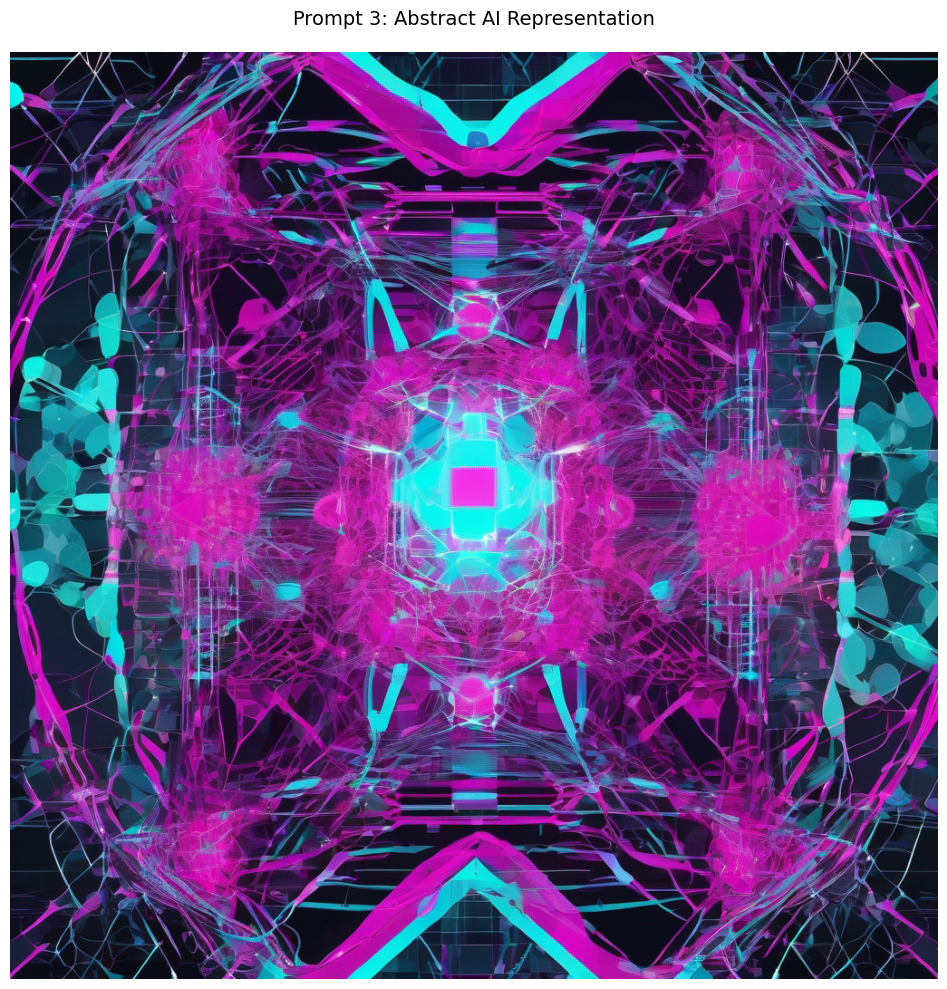

In [27]:
# Generate Image 3: Abstract
print("Generating abstract art image...")
print(f"Prompt: {prompts['prompt3_abstract']}")
print("\nThis may take 30-60 seconds...\n")

output = replicate.run(
    "stability-ai/sdxl:39ed52f2a78e934b3ba6e2a89f5b1c712de7dfea535525255b1aa35c5565e08b",
    input={
        "prompt": prompts['prompt3_abstract'],
        "negative_prompt": "realistic, photographic, blurry, low quality",
        "width": 1024,
        "height": 1024,
        "num_outputs": 1,
        "num_inference_steps": 40,
        "guidance_scale": 9.0
    }
)

# Download and display the image
img3 = download_image(output[0], "abstract_sd.png")
display_image(img3, "Prompt 3: Abstract AI Representation")

### Prompt 4: Architectural Generation

Generating architectural image...
Prompt: Modern sustainable architecture: glass and timber eco-house built into a hillside, large windows, green roof with plants, solar panels, minimalist design, architectural photography style

This may take 30-60 seconds...

Image saved as: architecture_sd.png


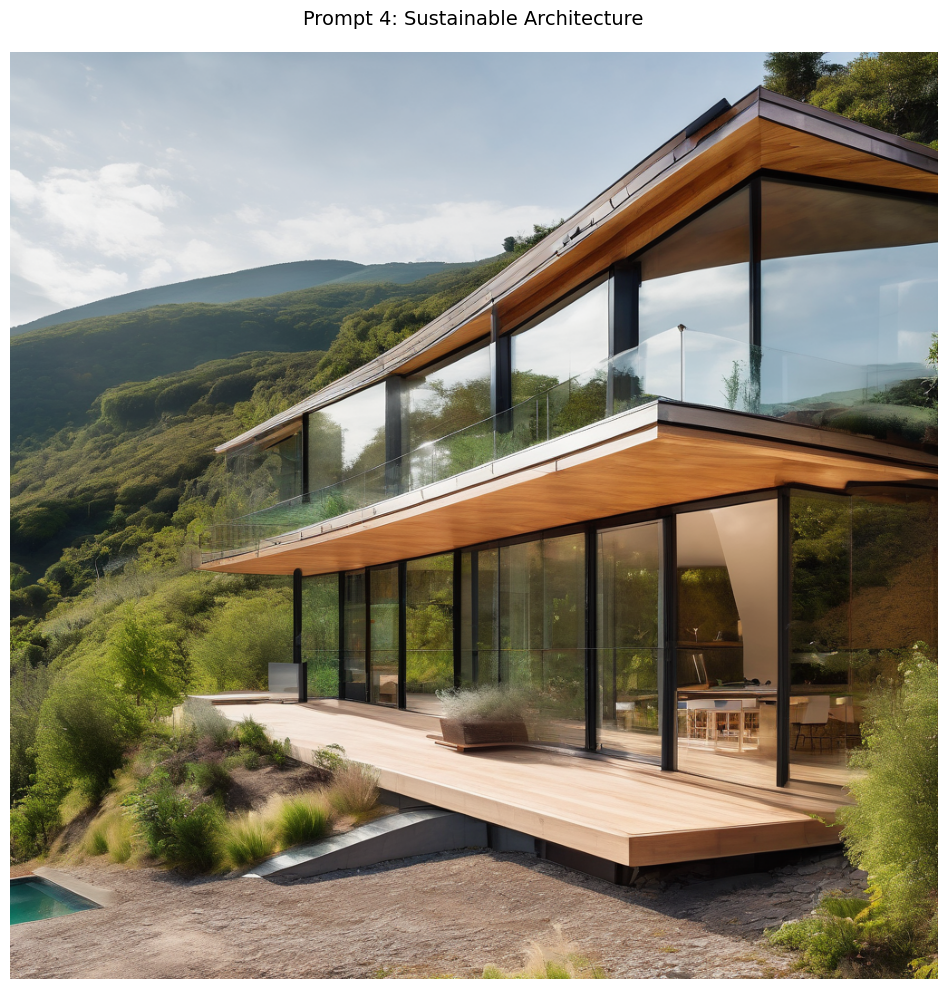

In [29]:
# Generate Image 4: Architecture
print("Generating architectural image...")
print(f"Prompt: {prompts['prompt4_architectural']}")
print("\nThis may take 30-60 seconds...\n")

output = replicate.run(
    "stability-ai/sdxl:39ed52f2a78e934b3ba6e2a89f5b1c712de7dfea535525255b1aa35c5565e08b",
    input={
        "prompt": prompts['prompt4_architectural'],
        "negative_prompt": "ugly, distorted, unrealistic proportions, blurry, low quality",
        "width": 1024,
        "height": 1024,
        "num_outputs": 1,
        "num_inference_steps": 40,
        "guidance_scale": 7.5
    }
)

# Download and display the image
img4 = download_image(output[0], "architecture_sd.png")
display_image(img4, "Prompt 4: Sustainable Architecture")

## Image Editing with Stable Diffusion

Now let's explore image editing capabilities. I will take one of our generated images and modify it using img2img (image-to-image) generation. This technique allows us to start with an existing image and modify it based on a new prompt.

Editing the landscape image to create a winter version...

Original Prompt: A serene mountain lake at sunset, with snow-capped peaks reflected in crystal clear water, pine trees in the foreground, vibrant orange and purple sky, photorealistic, 8k quality

Edit Prompt: A serene mountain lake in deep winter, frozen lake surface with snow, snow-covered pine trees, aurora borealis in the night sky, photorealistic, 8k quality

This may take 30-60 seconds...

Image saved as: landscape_winter_sd.png


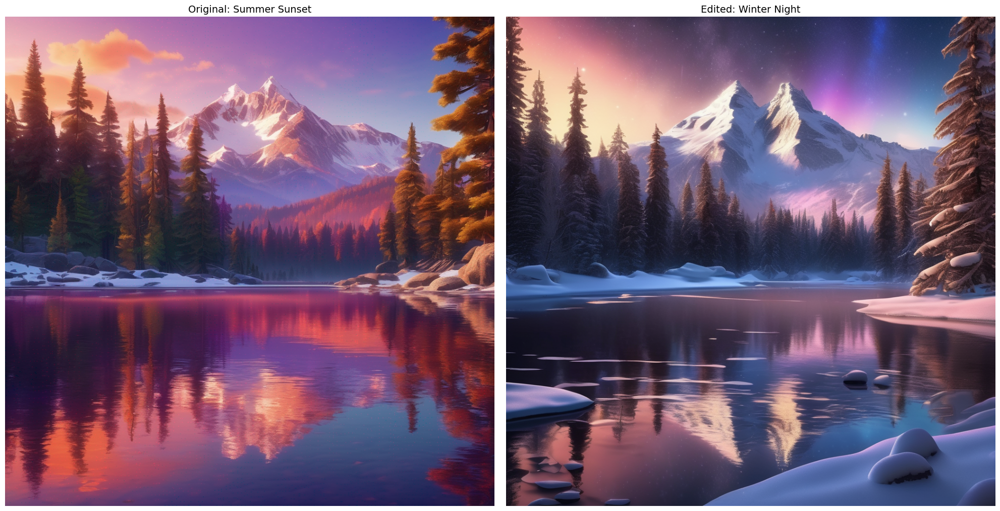

In [30]:
# Image editing example - modify the landscape to make it winter scene
print("Editing the landscape image to create a winter version...")

# First, we need to upload our image or use a URL
# For this example, we'll use the previously generated landscape image

edit_prompt = "A serene mountain lake in deep winter, frozen lake surface with snow, snow-covered pine trees, aurora borealis in the night sky, photorealistic, 8k quality"

print(f"\nOriginal Prompt: {prompts['prompt1_landscape']}")
print(f"\nEdit Prompt: {edit_prompt}")
print("\nThis may take 30-60 seconds...\n")

# Using img2img for editing
output = replicate.run(
    "stability-ai/sdxl:39ed52f2a78e934b3ba6e2a89f5b1c712de7dfea535525255b1aa35c5565e08b",
    input={
        "image": open("landscape_sd.png", "rb"),  # Use the previously generated image
        "prompt": edit_prompt,
        "negative_prompt": "summer, warm colors, green trees, ugly, blurry, low quality",
        "prompt_strength": 0.8,  # How much to change from original (0.0-1.0)
        "num_inference_steps": 40,
        "guidance_scale": 7.5
    }
)

# Download and display the edited image
img_edited = download_image(output[0], "landscape_winter_sd.png")

# Display both images side by side
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(img1)
axes[0].set_title('Original: Summer Sunset', fontsize=14)
axes[0].axis('off')
axes[1].imshow(img_edited)
axes[1].set_title('Edited: Winter Night', fontsize=14)
axes[1].axis('off')
plt.tight_layout()
plt.show()

## Reflection on API Usability

### Ease of Use

**Positive Aspects:**
1. **Simple Setup**: The Replicate API requires minimal configuration—just an API key and a few lines of code to generate images.
2. **Clear Documentation**: The API parameters are well-documented and intuitive (prompt, guidance_scale, steps, etc.).
3. **Flexible Parameters**: Easy to adjust image quality, size, and generation behavior through straightforward parameters.
4. **Consistent Results**: The API reliably produces high-quality images when given clear prompts.

**Challenges:**
1. **Cost Consideration**: Cloud-based APIs require payment per generation, which can add up during experimentation.
2. **Generation Time**: Each image takes 30-60 seconds, which can slow down iterative refinement.
3. **Prompt Engineering**: Achieving desired results requires careful prompt crafting and understanding of what works.
4. **Limited Control**: Some artistic decisions are made by the model, offering less control than traditional digital art tools.

### Technical Evaluation

The Stable Diffusion API through Replicate demonstrates strong capabilities across different image types:

- **Landscape images** typically show excellent composition and lighting
- **Character generation** can be hit-or-miss with fine details like hands and facial features
- **Abstract art** allows the model creative freedom and often produces interesting results
- **Architectural images** require very specific prompts to achieve realistic proportions

### Overall Assessment

The API is **moderately easy to use** for someone with basic Python knowledge. The primary challenge isn't the API itself, but rather learning effective prompt engineering. For practical applications, the API excels at rapid prototyping and concept visualization, though it may require multiple iterations to achieve desired results.

**Recommendation**: This tool is excellent for designers, content creators, and developers who need quick visual content generation, but may not replace specialized software for projects requiring precise control.

## Display All Generated Images

Let's create a final gallery view of all our generated images.

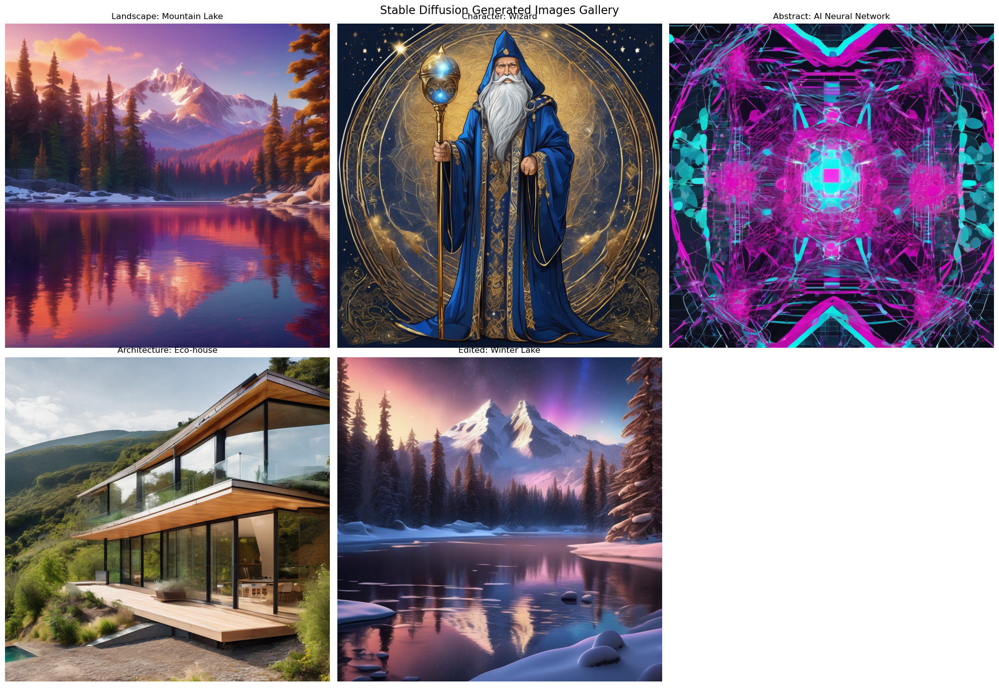


IMAGE GENERATION COMPLETE
Total images generated: 5

All images have been saved to the current directory.


In [31]:
# Create a gallery of all generated images
fig, axes = plt.subplots(2, 3, figsize=(20, 14))
fig.suptitle('Stable Diffusion Generated Images Gallery', fontsize=16, y=0.98)

# Load images
images = [
    (Image.open("landscape_sd.png"), "Landscape: Mountain Lake"),
    (Image.open("character_sd.png"), "Character: Wizard"),
    (Image.open("abstract_sd.png"), "Abstract: AI Neural Network"),
    (Image.open("architecture_sd.png"), "Architecture: Eco-house"),
    (Image.open("landscape_winter_sd.png"), "Edited: Winter Lake"),
]

for idx, (img, title) in enumerate(images):
    row = idx // 3
    col = idx % 3
    axes[row, col].imshow(img)
    axes[row, col].set_title(title, fontsize=12)
    axes[row, col].axis('off')

# Hide the last subplot if we have 5 images
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("IMAGE GENERATION COMPLETE")
print("="*60)
print(f"Total images generated: {len(images)}")
print("\nAll images have been saved to the current directory.")